___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

# WELCOME!

In this project, you must apply EDA processes for the development of predictive models. Handling outliers, domain knowledge and feature engineering will be challenges.

Also, this project aims to improve your ability to implement algorithms for Multi-Class Classification. Thus, you will have the opportunity to implement many algorithms commonly used for Multi-Class Classification problems.

Before diving into the project, please take a look at the determines and tasks.

# Determines

The 2012 US Army Anthropometric Survey (ANSUR II) was executed by the Natick Soldier Research, Development and Engineering Center (NSRDEC) from October 2010 to April 2012 and is comprised of personnel representing the total US Army force to include the US Army Active Duty, Reserves, and National Guard. In addition to the anthropometric and demographic data described below, the ANSUR II database also consists of 3D whole body, foot, and head scans of Soldier participants. These 3D data are not publicly available out of respect for the privacy of ANSUR II participants. The data from this survey are used for a wide range of equipment design, sizing, and tariffing applications within the military and has many potential commercial, industrial, and academic applications.

The ANSUR II working databases contain 93 anthropometric measurements which were directly measured, and 15 demographic/administrative variables explained below. The ANSUR II Male working database contains a total sample of 4,082 subjects. The ANSUR II Female working database contains a total sample of 1,986 subjects.


DATA DICT:
https://data.world/datamil/ansur-ii-data-dictionary/workspace/file?filename=ANSUR+II+Databases+Overview.pdf

---

To achieve high prediction success, you must understand the data well and develop different approaches that can affect the dependent variable.

Firstly, try to understand the dataset column by column using pandas module. Do research within the scope of domain (body scales, and race characteristics) knowledge on the internet to get to know the data set in the fastest way.

You will implement ***Logistic Regression, Support Vector Machine, XGBoost, Random Forest*** algorithms. Also, evaluate the success of your models with appropriate performance metrics.

At the end of the project, choose the most successful model and try to enhance the scores with ***SMOTE*** make it ready to deploy. Furthermore, use ***SHAP*** to explain how the best model you choose works.

# Tasks

#### 1. Exploratory Data Analysis (EDA)
- Import Libraries, Load Dataset, Exploring Data

    *i. Import Libraries*
    
    *ii. Ingest Data *
    
    *iii. Explore Data*
    
    *iv. Outlier Detection*
    
    *v.  Drop unnecessary features*

#### 2. Data Preprocessing
- Scale (if needed)
- Separete the data frame for evaluation purposes

#### 3. Multi-class Classification
- Import libraries
- Implement SVM Classifer
- Implement Decision Tree Classifier
- Implement Random Forest Classifer
- Implement XGBoost Classifer
- Compare The Models



# EDA
- Drop unnecessary colums
- Drop DODRace class if value count below 500 (we assume that our data model can't learn if it is below 500)

## Import Libraries
Besides Numpy and Pandas, you need to import the necessary modules for data visualization, data preprocessing, Model building and tuning.

*Note: Check out the course materials.*

In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
import shap

import seaborn as sns
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler ,OrdinalEncoder ,OneHotEncoder 
from sklearn.compose import make_column_transformer
from sklearn.model_selection import train_test_split ,GridSearchCV ,cross_val_score

from sklearn.metrics import classification_report, confusion_matrix, log_loss, recall_score, accuracy_score, precision_score, f1_score ,make_scorer,average_precision_score
from mlxtend.plotting import plot_confusion_matrix

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.pipeline import Pipeline
from yellowbrick.regressor import PredictionError
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

## Ingest Data from links below and make a dataframe
- Soldiers Male : https://query.data.world/s/h3pbhckz5ck4rc7qmt2wlknlnn7esr
- Soldiers Female : https://query.data.world/s/sq27zz4hawg32yfxksqwijxmpwmynq

## Explore Data

In [2]:
df_m = pd.read_csv("https://query.data.world/s/h3pbhckz5ck4rc7qmt2wlknlnn7esr", encoding="latin-1")
print(df_m.shape)
df_f = pd.read_csv("https://query.data.world/s/sq27zz4hawg32yfxksqwijxmpwmynq")
print(df_f.shape)

(4082, 108)
(1986, 108)


In [3]:
df_f.rename(columns={"SubjectId": "subjectid"}, inplace=True)

In [4]:
df = [df_m,df_f]
df = pd.concat(df, axis=0)
print(df.shape)

(6068, 108)


In [5]:
df.head(3)

,subjectid,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,bitragionchinarc,bitragionsubmandibulararc,bizygomaticbreadth,buttockcircumference,buttockdepth,buttockheight,buttockkneelength,buttockpopliteallength,calfcircumference,cervicaleheight,chestbreadth,chestcircumference,chestdepth,chestheight,crotchheight,crotchlengthomphalion,crotchlengthposterioromphalion,earbreadth,earlength,earprotrusion,elbowrestheight,eyeheightsitting,footbreadthhorizontal,footlength,forearmcenterofgriplength,forearmcircumferenceflexed,forearmforearmbreadth,forearmhandlength,functionalleglength,handbreadth,handcircumference,handlength,headbreadth,headcircumference,headlength,heelanklecircumference,heelbreadth,hipbreadth,hipbreadthsitting,iliocristaleheight,interpupillarybreadth,interscyei,interscyeii,kneeheightmidpatella,kneeheightsitting,lateralfemoralepicondyleheight,lateralmalleolusheight,lowerthighcircumference,mentonsellionlength,neckcircumference,neckcircumferencebase,overheadfingertipreachsitting,palmlength,poplitealheight,radialestylionlength,shouldercircumference,shoulderelbowlength,shoulderlength,sittingheight,sleevelengthspinewrist,sleeveoutseam,span,stature,suprasternaleheight,tenthribheight,thighcircumference,thighclearance,thumbtipreach,tibialheight,tragiontopofhead,trochanterionheight,verticaltrunkcircumferenceusa,waistbacklength,waistbreadth,waistcircumference,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,Gender,Date,Installation,Component,Branch,PrimaryMOS,SubjectsBirthLocation,SubjectNumericRace,Ethnicity,DODRace,Age,Heightin,Weightlbs,WritingPreference
0,10027,266,1467,337,222,1347,253,202,401,369,274,493,71,319,291,142,979,240,882,619,509,373,1535,291,1074,259,1292,877,607,351,36,71,19,247,802,101,273,349,299,575,477,1136,90,214,193,150,583,206,326,70,332,366,1071,685,422,441,502,560,500,77,391,118,400,436,1447,113,437,273,1151,368,145,928,883,600,1782,1776,1449,1092,610,164,786,491,140,919,1700,501,329,933,240,440,1054,815,175,853,Male,4-Oct-10,Fort Hood,Regular Army,Combat Arms,19D,North Dakota,1,NaN,1,41,71,180,Right hand
1,10032,233,1395,326,220,1293,245,193,394,338,257,479,67,344,320,135,944,232,870,584,468,357,1471,269,1021,253,1244,851,615,376,33,62,18,232,781,98,263,348,289,523,476,1096,86,203,195,146,568,201,334,72,312,356,1046,620,441,447,490,540,488,73,371,131,380,420,1380,118,417,254,1119,353,141,884,868,564,1745,1702,1387,1076,572,169,822,476,120,918,1627,432,316,870,225,371,1054,726,167,815,Male,4-Oct-10,Fort Hood,Regular Army,Combat Support,68W,New York,1,NaN,1,35,68,160,Left hand
2,10033,287,1430,341,230,1327,256,196,427,408,261,544,75,345,330,135,1054,258,901,623,506,412,1501,288,1120,267,1288,854,636,359,40,61,23,237,810,103,270,355,357,575,491,1115,93,220,203,148,573,202,356,70,349,393,1053,665,462,475,496,556,482,72,409,123,403,434,1447,121,431,268,1276,367,167,917,910,604,1867,1735,1438,1105,685,198,807,477,125,918,1678,472,329,964,255,411,1041,929,180,831,Male,4-Oct-10,Fort Hood,Regular Army,Combat Support,68W,New York,2,NaN,2,42,68,205,Left hand


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6068 entries, 0 to 1985
Columns: 108 entries, subjectid to WritingPreference
dtypes: int64(99), object(9)
memory usage: 5.0+ MB


In [7]:
df.info(max_cols=110)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6068 entries, 0 to 1985
Data columns (total 108 columns):
 #    Column                          Non-Null Count  Dtype 
---   ------                          --------------  ----- 
 0    subjectid                       6068 non-null   int64 
 1    abdominalextensiondepthsitting  6068 non-null   int64 
 2    acromialheight                  6068 non-null   int64 
 3    acromionradialelength           6068 non-null   int64 
 4    anklecircumference              6068 non-null   int64 
 5    axillaheight                    6068 non-null   int64 
 6    balloffootcircumference         6068 non-null   int64 
 7    balloffootlength                6068 non-null   int64 
 8    biacromialbreadth               6068 non-null   int64 
 9    bicepscircumferenceflexed       6068 non-null   int64 
 10   bicristalbreadth                6068 non-null   int64 
 11   bideltoidbreadth                6068 non-null   int64 
 12   bimalleolarbreadth              

In [8]:
df.notnull().sum().any()

True

In [9]:
df.duplicated().sum()

0

In [10]:
df.describe().T 
#Ethnicity a lot of null value

,count,mean,std,min,25%,50%,75%,max
subjectid,6068.0,20757.198418,13159.390894,10027.0,14841.75,20063.5,27234.50,920103.0
abdominalextensiondepthsitting,6068.0,246.468688,37.400106,155.0,219.00,242.0,271.00,451.0
acromialheight,6068.0,1406.161338,79.091048,1115.0,1350.00,1410.0,1462.00,1683.0
acromionradialelength,6068.0,327.374423,20.720018,249.0,313.00,328.0,341.25,393.0
anklecircumference,6068.0,224.891397,16.051833,156.0,214.00,225.0,235.00,293.0
axillaheight,6068.0,1299.608767,72.022286,1038.0,1249.00,1302.0,1349.00,1553.0
balloffootcircumference,6068.0,244.192650,16.845020,186.0,232.00,245.0,256.00,306.0
balloffootlength,6068.0,194.754614,13.516368,151.0,185.00,195.0,204.00,245.0
biacromialbreadth,6068.0,399.204186,30.236914,283.0,376.00,404.0,421.00,489.0
bicepscircumferenceflexed,6068.0,340.934245,41.519866,216.0,311.00,341.0,370.00,490.0


In [11]:
for i,columnss in enumerate(df.select_dtypes("object").columns):
    print(f"{i}.{columnss:<7}:{df[columnss].unique()}")
    

0.Gender :['Male' 'Female']
1.Date   :['4-Oct-10' '12-Oct-10' '6-Oct-10' '7-Oct-10' '13-Oct-10' '14-Oct-10'
 '15-Oct-10' '18-Oct-10' '19-Oct-10' '20-Oct-10' '21-Oct-10' '22-Oct-10'
 '25-Oct-10' '26-Oct-10' '27-Oct-10' '28-Oct-10' '29-Oct-10' '2-Nov-10'
 '4-Nov-10' '17-Nov-10' '16-Nov-10' '18-Nov-10' '19-Nov-10' '22-Nov-10'
 '23-Nov-10' '29-Nov-10' '30-Nov-10' '1-Dec-10' '2-Dec-10' '3-Dec-10'
 '6-Dec-10' '7-Dec-10' '10-Dec-10' '8-Dec-10' '13-Dec-10' '14-Dec-10'
 '5-Jan-11' '7-Jan-11' '10-Jan-11' '11-Jan-11' '12-Jan-11' '13-Jan-11'
 '19-Jan-11' '18-Jan-11' '20-Jan-11' '21-Jan-11' '27-Jan-11' '28-Jan-11'
 '30-Jan-11' '31-Jan-11' '7-Feb-11' '8-Feb-11' '9-Feb-11' '11-Feb-11'
 '15-Feb-11' '16-Feb-11' '17-Feb-11' '22-Feb-11' '24-Feb-11' '25-Feb-11'
 '9-Mar-11' '11-Mar-11' '14-Mar-11' '15-Mar-11' '16-Mar-11' '17-Mar-11'
 '18-Mar-11' '22-Mar-11' '21-Mar-11' '24-Mar-11' '25-Mar-11' '26-Mar-11'
 '29-Mar-11' '30-Mar-11' '31-Mar-11' '8-Apr-11' '11-Apr-11' '12-Apr-11'
 '13-Apr-11' '14-Apr-11' '18-Ap

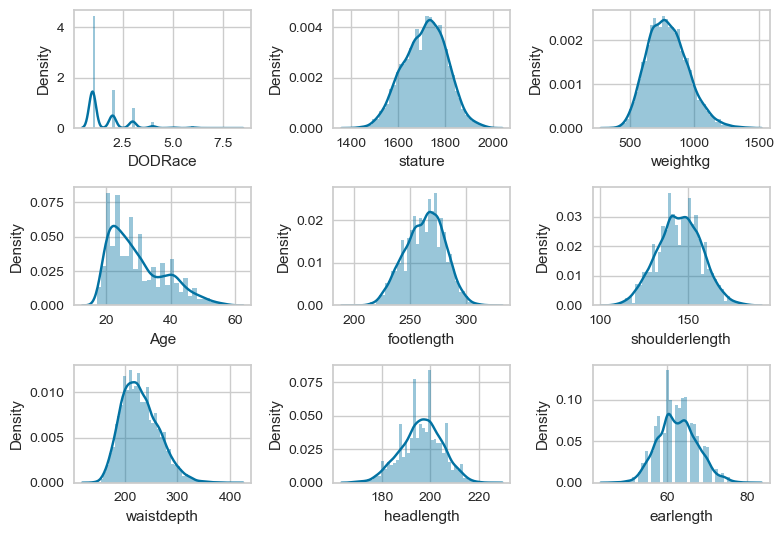

In [12]:
for i, column in enumerate(df[['DODRace','stature','weightkg', \
                               'Age','footlength' ,'shoulderlength' ,\
                               'waistdepth','headlength','earlength']] , 1):
    plt.subplot(3,3,i)
    sns.distplot(df[column])
    plt.tight_layout()

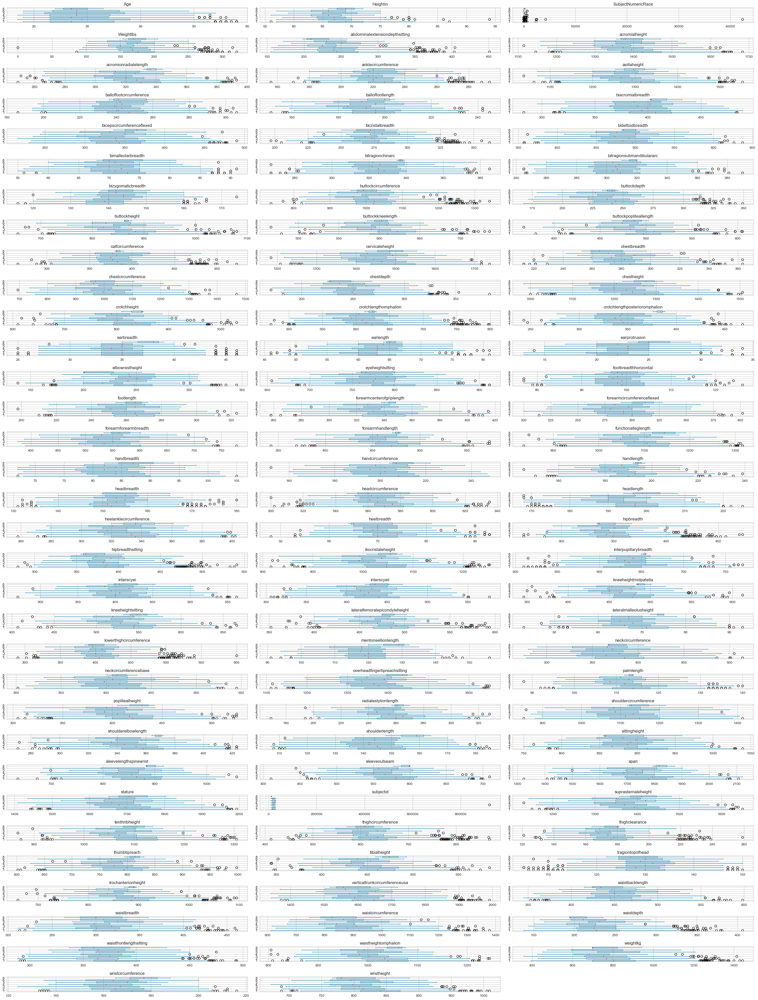

In [13]:
df.reset_index(drop=True, inplace=True)
df.plot(by ='DODRace', kind="box", subplots=True, layout=(42, 3), figsize=(30, 50), vert=False, sharex=False, sharey=False)
plt.tight_layout();

In [14]:
df["DODRace"] = df.DODRace.map(
    {
        1: "White",
        2: "Black",
        3: "Hispanic",
        4: "Asian",
        5: "Native American",
        6: "Pacific Islander",
        8: "Other",
    }
)

White               3792
Black               1298
Hispanic             679
Asian                188
Pacific Islander      59
Native American       49
Other                  3
Name: DODRace, dtype: int64
White               0.624918
Black               0.213909
Hispanic            0.111898
Asian               0.030982
Pacific Islander    0.009723
Native American     0.008075
Other               0.000494
Name: DODRace, dtype: float64


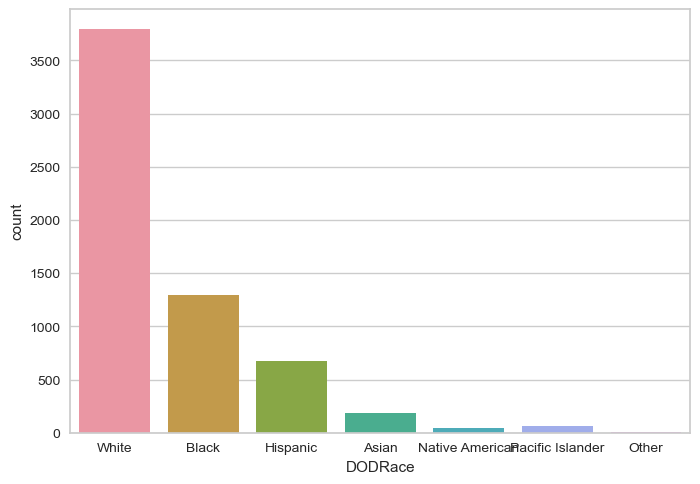

In [15]:
print(df["DODRace"].value_counts())
print(df["DODRace"].value_counts(normalize= True))
sns.countplot(data = df, x = "DODRace");

In [16]:
df.groupby(["Component", "Branch"])["DODRace"].value_counts(normalize=True)

Component            Branch                  DODRace         
Army National Guard  Combat Arms             White               0.771995
                                             Black               0.097893
                                             Hispanic            0.091698
                                             Asian               0.022305
                                             Native American     0.011152
                                             Pacific Islander    0.004957
                     Combat Service Support  White               0.643509
                                             Black               0.218947
                                             Hispanic            0.099649
                                             Asian               0.023158
                                             Pacific Islander    0.007719
                                             Native American     0.007018
                     Combat Support          White

In [17]:
df['SubjectsBirthLocation'].value_counts()

California                  446
New York                    420
Texas                       397
Indiana                     266
Oklahoma                    221
Illinois                    216
Florida                     210
Minnesota                   200
Michigan                    196
Mississippi                 194
Georgia                     170
Alabama                     164
South Carolina              161
North Carolina              149
Ohio                        142
Louisiana                   137
Pennsylvania                132
Virginia                    118
Massachusetts               112
Wisconsin                   102
Germany                      92
New Jersey                   89
Puerto Rico                  88
Arizona                      84
Missouri                     84
Colorado                     81
Maryland                     80
Tennessee                    74
Kentucky                     69
Washington                   66
Kansas                       63
South Da

In [18]:
states_by_region = {
    "Alabama": "South",
    "Alaska": "West",
    "Arizona": "West",
    "Arkansas": "South",
    "California": "West",
    "Colorado": "West",
    "Connecticut": "Northeast",
    "Delaware": "Mid Atlantic",
    "Florida": "South",
    "Georgia": "South",
    "Hawaii": "West",
    "Idaho": "West",
    "Illinois": "Midwest",
    "Indiana": "Midwest",
    "Iowa": "Midwest",
    "Kansas": "Midwest",
    "Kentucky": "South",
    "Louisiana": "South",
    "Maine": "Northeast",
    "Maryland": "Mid Atlantic",
    "Massachusetts": "Northeast",
    "Michigan": "Midwest",
    "Minnesota": "Midwest",
    "Mississippi": "South",
    "Missouri": "Midwest",
    "Montana": "West",
    "Nebraska": "Midwest",
    "Nevada": "West",
    "New Hampshire": "Northeast",
    "New Jersey": "Mid Atlantic",
    "New Mexico": "West",
    "New York": "Northeast",
    "North Carolina": "South",
    "North Dakota": "Midwest",
    "Ohio": "Midwest",
    "Oklahoma": "South",
    "Oregon": "West",
    "Pennsylvania": "Mid Atlantic",
    "Rhode Island": "Northeast",
    "South Carolina": "South",
    "South Dakota": "Midwest",
    "Tennessee": "South",
    "Texas": "South",
    "Utah": "West",
    "Vermont": "Northeast",
    "Virginia": "Mid Atlantic",
    "Washington": "West",
    "West Virginia": "South",
    "Wisconsin": "Midwest",
    "Wyoming": "West",
    "District of Columbia": "Mid Atlantic"
}

In [19]:
countries_by_continent = {
    "Afghanistan": "Asia",
    "Albania": "Europe",
    "Algeria": "Africa",
    "American Samoa": "Oceania",
    "Andorra": "Europe",
    "Angola": "Africa",
    "Antigua and Barbuda": "North America",
    "Argentina": "South America",
    "Armenia": "Asia",
    "Australia": "Oceania",
    "Austria": "Europe",
    "Azerbaijan": "Asia",
    "Bahamas": "North America",
    "Bahrain": "Asia",
    "Bangladesh": "Asia",
    "Barbados": "North America",
    "Belarus": "Europe",
    "Belgium": "Europe",
    "Belize": "North America",
    "Benin": "Africa",
    "Bhutan": "Asia",
    "Bolivia": "South America",
    "Bosnia and Herzegovina": "Europe",
    "Botswana": "Africa",
    "Brazil": "South America",
    "British Virgin Islands": "North America",
    "Brunei": "Asia",
    "Bulgaria": "Europe",
    "Burkina Faso": "Africa",
    "Burundi": "Africa",
    "Cambodia": "Asia",
    "Cameroon": "Africa",
    "Canada": "North America",
    "Cape Verde": "Africa",
    "Central African Republic": "Africa",
    "Chad": "Africa",
    "Chile": "South America",
    "China": "Asia",
    "Colombia": "South America",
    "Comoros": "Africa",
    "Congo, Democratic Republic of the": "Africa",
    "Congo, Republic of the": "Africa",
    "Costa Rica": "North America",
    "Côte d'Ivoire": "Africa",
    "Croatia": "Europe",
    "Cuba": "North America",
    "Cyprus": "Europe",
    "Czech Republic": "Europe",
    "Denmark": "Europe",
    "Djibouti": "Africa",
    "Dominica": "North America",
    "Dominican Republic": "North America",
    "East Timor": "Asia",
    "Ecuador": "South America",
    "Egypt": "Africa",
    "El Salvador": "North America",
    "England": "Europe",
    "Equatorial Guinea": "Africa",
    "Eritrea": "Africa",
    "Estonia": "Europe",
    "Eswatini": "Africa",
    "Ethiopia": "Africa",
    "Federated States of Micronesia": "Oceania",
    "Fiji": "Oceania",
    "Finland": "Europe",
    "France": "Europe",
    "French Guiana": "South America",
    "Gabon": "Africa",
    "Gambia": "Africa",
    "Georgia": "Asia",
    "Germany": "Europe",
    "Ghana": "Africa",
    "Greece": "Europe",
    "Grenada": "North America",
    "Guam": "Oceania",
    "Guadalupe" : "North America",
    "Guatemala": "North America",
    "Guinea": "Africa",
    "Guinea-Bissau": "Africa",
    "Guyana": "South America",
    "Haiti": "North America",
    "Honduras": "North America",
    "Hungary": "Europe",
    "Iceland": "Europe",
    "India": "Asia",
    "Indonesia": "Asia",
    "Iran": "Asia",
    "Iraq": "Asia",
    "Ireland": "Europe",
    "Israel": "Asia",
    "Italy": "Europe",
    "Ivory Coast": "Africa",
    "Jamaica": "North America",
    "Japan": "Asia",
    "Jordan": "Asia",
    "Kazakhstan": "Asia",
    "Kenya": "Africa",
    "Kiribati": "Oceania",
    "Kosovo": "Europe",
    "Kuwait": "Asia",
    "Kyrgyzstan": "Asia",
    "Laos": "Asia",
    "Latvia": "Europe",
    "Lebanon": "Asia",
    "Lesotho": "Africa",
    "Liberia": "Africa",
    "Libya": "Africa",
    "Liechtenstein": "Europe",
    "Lithuania": "Europe",
    "Luxembourg": "Europe",
    "Macedonia, Republic of": "Europe",
    "Madagascar": "Africa",
    "Malawi": "Africa",
    "Malaysia": "Asia",
    "Maldives": "Asia",
    "Mali": "Africa",
    "Malta": "Europe",
    "Marshall Islands": "Oceania",
    "Mauritania": "Africa",
    "Mauritius": "Africa",
    "Mexico": "North America",
    "Micronesia": "Oceania",
    "Moldova": "Europe",
    "Monaco": "Europe",
    "Mongolia": "Asia",
    "Montenegro": "Europe",
    "Morocco": "Africa",
    "Mozambique": "Africa",
    "Myanmar (Burma)": "Asia",
    "Namibia": "Africa",
    "Nauru": "Oceania",
    "Nepal": "Asia",
    "Netherlands": "Europe",
    "New Zealand": "Oceania",
    "Nicaragua": "North America",
    "Niger": "Africa",
    "Nigeria": "Africa",
    "North Korea": "Asia",
    "Norway": "Europe",
    "Oman": "Asia",
    "Pakistan": "Asia",
    "Palau": "Oceania",
    "Palestine": "Asia",
    "Panama": "North America",
    "Papua New Guinea": "Oceania",
    "Paraguay": "South America",
    "Peru": "South America",
    "Philippines": "Asia",
    "Poland": "Europe",
    "Portugal": "Europe",
    "Puerto Rico": "North America",
    "Qatar": "Asia",
    "Romania": "Europe",
    "Russia": "Europe",
    "Rwanda": "Africa",
    "Saint Kitts and Nevis": "North America",
    "Saint Lucia": "North America",
    "Saint Vincent and the Grenadines": "North America",
    "Samoa": "Oceania",
    "San Marino": "Europe",
    "Sao Tome and Principe": "Africa",
    "Saudi Arabia": "Asia",
    "Scotland": "Europe",
    "Senegal": "Africa",
    "Serbia": "Europe",
    "Seychelles": "Africa",
    "Sierra Leone": "Africa",
    "Singapore": "Asia",
    "Slovakia": "Europe",
    "Slovenia": "Europe",
    "Solomon Islands": "Oceania",
    "Somalia": "Africa",
    "South Africa": "Africa",
    "South Korea": "Asia",
    "South Sudan": "Africa",
    "Spain": "Europe",
    "Sri Lanka": "Asia",
    "Sudan": "Africa",
    "Suriname": "South America",
    "Swaziland": "Africa",
    "Sweden": "Europe",
    "Switzerland": "Europe",
    "Syria": "Asia",
    "Taiwan": "Asia",
    "Tajikistan": "Asia",
    "Tanzania": "Africa",
    "Thailand": "Asia",
    "Togo": "Africa",
    "Tonga": "Oceania",
    "Trinidad and Tobago": "North America",
    "Tunisia": "Africa",
    "Turkey": "Europe",
    "Turkmenistan": "Asia",
    "Tuvalu": "Oceania",
    "Uganda": "Africa",
    "Ukraine": "Europe",
    "United Arab Emirates": "Asia",
    "United Kingdom": "Europe",
    "United States": "North America",
    "Uruguay": "South America",
    "US Virgin Islands": "North America",
    "Uzbekistan": "Asia",
    "Vanuatu": "Oceania",
    "Vatican City": "Europe",
    "Venezuela": "South America",
    "Vietnam": "Asia",
    "Wales": "Europe",
    "Yemen": "Asia",
    "Zambia": "Africa",
    "Zimbabwe": "Africa",
    "South America": "South America",
    "Burma": "Asia",
    "Korea": "Asia",
    "Northern Mariana Islands": "Oceania",
    "Bermuda": "North America",
}


In [20]:

df["SubjectsBirthLocation"] = [i if i in states_by_region else countries_by_continent[i] for i in df["SubjectsBirthLocation"].values ]
df["SubjectsBirthLocation"].value_counts()


California              446
New York                420
Texas                   397
Indiana                 266
North America           265
Oklahoma                221
Illinois                216
Florida                 210
Minnesota               200
Michigan                196
Mississippi             194
Georgia                 170
Alabama                 164
South Carolina          161
North Carolina          149
Europe                  149
Asia                    144
Ohio                    142
Louisiana               137
Pennsylvania            132
Virginia                118
Massachusetts           112
Wisconsin               102
New Jersey               89
Missouri                 84
Arizona                  84
Colorado                 81
Maryland                 80
Tennessee                74
Kentucky                 69
Washington               66
Kansas                   63
South Dakota             56
Iowa                     55
Arkansas                 54
South America       

In [21]:
plt.figure(figsize=(400, 240))
mask = np.triu(np.ones_like(df.corr())) #mask for the upper half
heatmap = sns.heatmap(df.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')


### Drop DODRace class if value count below 500

In [22]:
df = df[df["DODRace"].isin(["White", "Black", "Hispanic"])]
df.shape

(5769, 108)

### Drop unnecessary fetures

In [23]:
df = df.drop(['subjectid', 'SubjectNumericRace' , 'Date' , 'Installation' ,'Weightlbs' ,'Heightin' , 'Ethnicity',"Component",
    "Branch",'PrimaryMOS'], axis=1)
df.shape

(5769, 98)

### Already try all  same steps  without  multicollinearity get result worst.
### But these all columns if get drope from data frame it will be clean( for other model Perhaps get better result without multicollinearity)

df = df.drop(['axillaheight', 'buttockkneelength','cervicaleheight','bideltoidbreadth','chestheight','crotchheight',
              'footbreadthhorizontal','footlength','bicepscircumferenceflexed','functionalleglength',
              'handlength','handcircumference','buttockcircumference','hipbreadthsitting','iliocristaleheight','interscyeii',
              'kneeheightsitting','lateralfemoralepicondyleheight','neckcircumference','neckcircumferencebase',
              'forearmcircumferenceflexed','shoulderelbowlength','sittingheight','sleeveoutseam','span','stature',
              'suprasternaleheight','tenthribheight','thighcircumference','tibialheight','waistdepth','waistbreadth',
              'abdominalextensiondepthsitting','waistheightomphalion','weightkg','acromialheight','functionalleglength',
          'kneeheightmidpatella','forearmcenterofgriplength','forearmhandlength','shouldercircumference','trochanterionheight'],         axis=1)
 
df.shape #(5769, 57)


# DATA Preprocessing
- In this step we divide our data to X(Features) and y(Target) then ,
- To train and evaluation purposes we create train and test sets,
- Lastly, scale our data if features not in same scale. Why?

In [24]:
X= df.drop("DODRace" , axis= "columns")
y= df["DODRace"]

### Splitting data into training and testing

In [25]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.20  ,random_state=101, stratify=y)

In [26]:
print("Train features shape : ", X_train.shape)
print("Train target shape   : ", y_train.shape)
print("Test features shape  : ", X_test.shape)
print("Test target shape    : ", y_test.shape)

Train features shape :  (4615, 97)
Train target shape   :  (4615,)
Test features shape  :  (1154, 97)
Test target shape    :  (1154,)


### column transform

In [27]:
object_col = X_train.select_dtypes("object").columns
print(object_col)
column_trans = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", sparse_output=False), object_col),
    remainder=MinMaxScaler(),
    verbose_feature_names_out=False)


Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object')


In [28]:
X_train_trans = column_trans.fit_transform(X_train)
X_test_trans = column_trans.transform(X_test)

### Function for evaluation & visualizaion 

In [29]:
def Pred_EvalMetric(model, X_train, y_train, X_test, y_test):

    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_test, y_pred), show_normed = True, figsize=(4,4))
    plt.title('Confusion Matrix test', fontsize=18)
    plt.show()
    print(classification_report(y_test, y_pred))
    print()
    
    print("\tTrain_Set\n")
    fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_train, y_train_pred), show_normed = True, figsize=(4,4))
    plt.title('Confusion Matrix train', fontsize=18)
    plt.show()
    print(classification_report(y_train, y_train_pred))

# Modelling
- Fit the model with train dataset
- Get predict from vanilla model on both train and test sets to examine if there is over/underfitting   
- Apply GridseachCV for both hyperparemeter tuning and sanity test of our model.
- Use hyperparameters that you find from gridsearch and make final prediction and evaluate the result according to chosen metric.

## 1. Logistic model

### Vanilla Logistic Model

In [30]:
log_model = LogisticRegression(class_weight="balanced", max_iter=1000, random_state=101)

In [31]:
step1 = [("OneHotEncoder", column_trans),("model", log_model)]

log_pipe = Pipeline(steps=step1)

In [32]:
log_pipe.fit(X_train, y_train)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('model',
                 LogisticRegression(class_weight='balanced', max_iter=1000,
                                    random_state=101))])

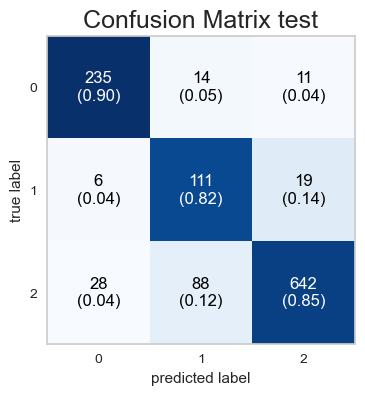

              precision    recall  f1-score   support

       Black       0.87      0.90      0.89       260
    Hispanic       0.52      0.82      0.64       136
       White       0.96      0.85      0.90       758

    accuracy                           0.86      1154
   macro avg       0.78      0.86      0.81      1154
weighted avg       0.89      0.86      0.86      1154


	Train_Set



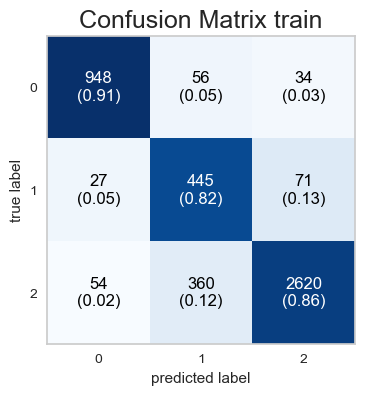

              precision    recall  f1-score   support

       Black       0.92      0.91      0.92      1038
    Hispanic       0.52      0.82      0.63       543
       White       0.96      0.86      0.91      3034

    accuracy                           0.87      4615
   macro avg       0.80      0.87      0.82      4615
weighted avg       0.90      0.87      0.88      4615



In [33]:
Pred_EvalMetric(log_pipe, X_train, y_train, X_test, y_test)

### Logistic Model GridsearchCV

In [34]:
recall_Hispanic = make_scorer(recall_score, average=None, labels=["Hispanic"])

In [35]:

penalty = ["l1", "l2"] 
C = [0.5, 1 ,1.5,2] 
class_weight= ["balanced", None] 
solver = ["lbfgs", "liblinear", "sag", "saga"] 
param_grid = {"model__penalty" : penalty,
              "model__C" : C,
              "model__class_weight":class_weight,#remove balence
              "model__solver":solver} 

log_grid_model = GridSearchCV(estimator=log_pipe,
                          param_grid=param_grid,
                          cv=10,
                          scoring = recall_Hispanic,       
                          n_jobs = -1)

In [36]:
log_grid_model.fit(X_train,y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('OneHotEncoder',
                                        ColumnTransformer(remainder=MinMaxScaler(),
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                                          verbose_feature_names_out=False)),
                                       ('model',
                                        LogisticRegression(class_weight='balanced',
                                                           max_iter=1000,
                                                           random_state=101))]),
             n_jobs=-1,
             param_grid={'model__C': [0.5, 1, 1.5, 2],
                         'model__class_weight': ['balanced', None],
                         'model__penalty': ['l1', 'l2'],
                         'model__solver': ['lbfgs', 'liblinear', 'sag',
                                           'saga']},
             scoring=make_scorer(recall_score, average=None, labels=['Hispanic']))

In [37]:
log_grid_model.best_params_ 

{'model__C': 2,
 'model__class_weight': 'balanced',
 'model__penalty': 'l2',
 'model__solver': 'lbfgs'}

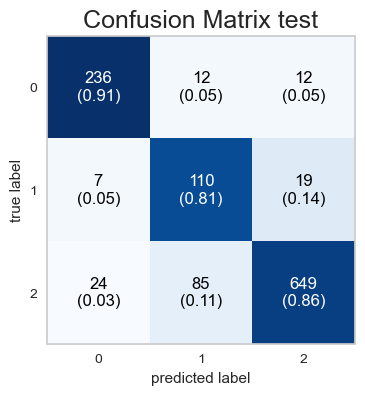

              precision    recall  f1-score   support

       Black       0.88      0.91      0.90       260
    Hispanic       0.53      0.81      0.64       136
       White       0.95      0.86      0.90       758

    accuracy                           0.86      1154
   macro avg       0.79      0.86      0.81      1154
weighted avg       0.89      0.86      0.87      1154


	Train_Set



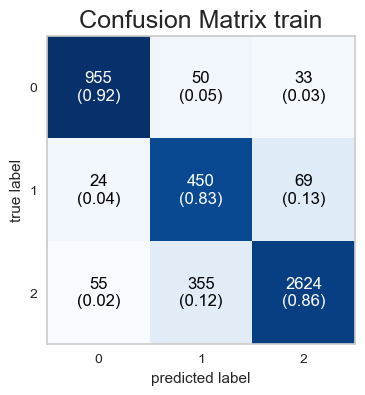

              precision    recall  f1-score   support

       Black       0.92      0.92      0.92      1038
    Hispanic       0.53      0.83      0.64       543
       White       0.96      0.86      0.91      3034

    accuracy                           0.87      4615
   macro avg       0.80      0.87      0.83      4615
weighted avg       0.90      0.87      0.88      4615



In [38]:
Pred_EvalMetric(log_grid_model, X_train, y_train, X_test, y_test)

## 2. SVC

### Vanilla SVC model

In [39]:
svc_model = SVC(class_weight="balanced", random_state=101)
step2 = [("OneHotEncoder", column_trans),("model", svc_model)]

svc_pipe = Pipeline(steps=step2)

In [40]:
svc_pipe.fit(X_train, y_train)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('model', SVC(class_weight='balanced', random_state=101))])

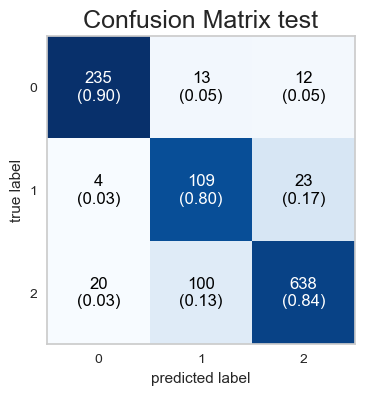

              precision    recall  f1-score   support

       Black       0.91      0.90      0.91       260
    Hispanic       0.49      0.80      0.61       136
       White       0.95      0.84      0.89       758

    accuracy                           0.85      1154
   macro avg       0.78      0.85      0.80      1154
weighted avg       0.88      0.85      0.86      1154


	Train_Set



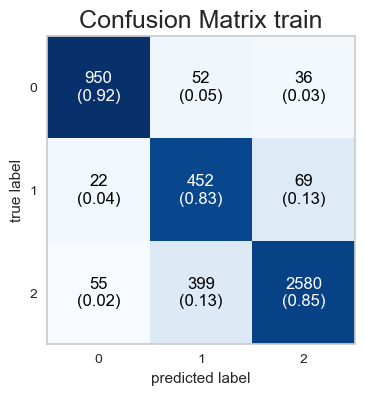

              precision    recall  f1-score   support

       Black       0.93      0.92      0.92      1038
    Hispanic       0.50      0.83      0.63       543
       White       0.96      0.85      0.90      3034

    accuracy                           0.86      4615
   macro avg       0.80      0.87      0.82      4615
weighted avg       0.90      0.86      0.87      4615



In [41]:
Pred_EvalMetric(svc_pipe, X_train, y_train, X_test, y_test)

###  SVC Model GridsearchCV

In [42]:
gamma = ["scale", "auto", 0.01] 
C = [0.5, 1 ,1.5]   
param_grid = {"model__gamma" : gamma,
              "model__C" : C} 

svc_grid_model = GridSearchCV(
    svc_pipe,
    param_grid,
    scoring=recall_Hispanic,
    cv=10,
    n_jobs=-1)

In [43]:
svc_grid_model.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('OneHotEncoder',
                                        ColumnTransformer(remainder=MinMaxScaler(),
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                                          verbose_feature_names_out=False)),
                                       ('model',
                                        SVC(class_weight='balanced',
                                            random_state=101))]),
             n_jobs=-1,
             param_grid={'model__C': [0.5, 1, 1.5],
                         'model__gamma': ['scale', 'auto', 0.01]},
             scoring=make_scorer(recall_score, average=None, labels=['Hispanic']))

In [44]:
svc_grid_model.best_params_ 

{'model__C': 1.5, 'model__gamma': 'scale'}

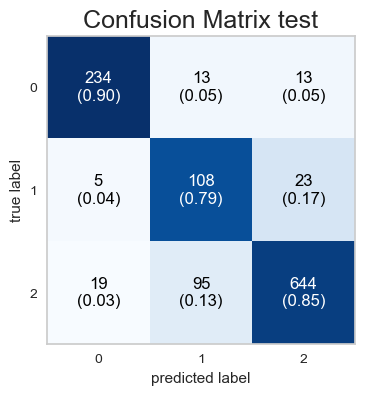

              precision    recall  f1-score   support

       Black       0.91      0.90      0.90       260
    Hispanic       0.50      0.79      0.61       136
       White       0.95      0.85      0.90       758

    accuracy                           0.85      1154
   macro avg       0.78      0.85      0.80      1154
weighted avg       0.89      0.85      0.86      1154


	Train_Set



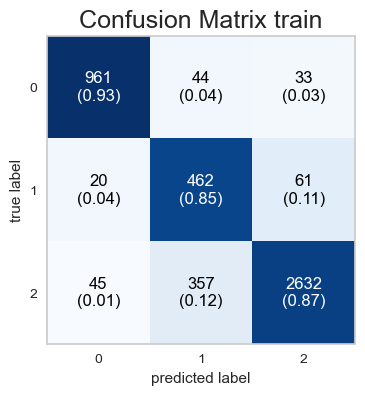

              precision    recall  f1-score   support

       Black       0.94      0.93      0.93      1038
    Hispanic       0.54      0.85      0.66       543
       White       0.97      0.87      0.91      3034

    accuracy                           0.88      4615
   macro avg       0.81      0.88      0.83      4615
weighted avg       0.91      0.88      0.89      4615



In [45]:
Pred_EvalMetric(svc_grid_model, X_train, y_train, X_test, y_test)

## 3. RF

### Vanilla RF Model

In [46]:
rf_model = RandomForestClassifier(class_weight="balanced", random_state=101)
step3 = [("OneHotEncoder", column_trans),("model", rf_model)]

rf_pipe = Pipeline(steps=step3)

In [47]:
rf_pipe.fit(X_train, y_train)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('model',
                 RandomForestClassifier(class_weight='balanced',
                                        random_state=101))])

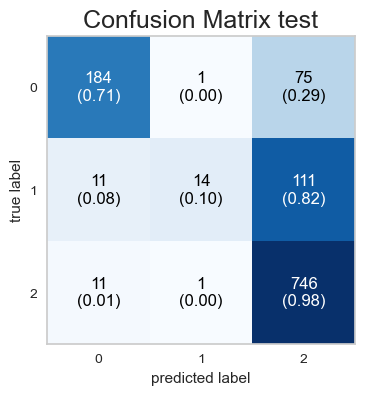

              precision    recall  f1-score   support

       Black       0.89      0.71      0.79       260
    Hispanic       0.88      0.10      0.18       136
       White       0.80      0.98      0.88       758

    accuracy                           0.82      1154
   macro avg       0.86      0.60      0.62      1154
weighted avg       0.83      0.82      0.78      1154


	Train_Set



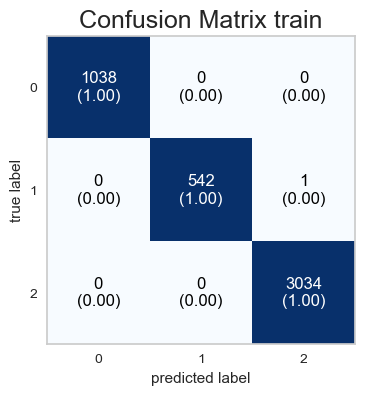

              precision    recall  f1-score   support

       Black       1.00      1.00      1.00      1038
    Hispanic       1.00      1.00      1.00       543
       White       1.00      1.00      1.00      3034

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



In [48]:
Pred_EvalMetric(rf_pipe, X_train, y_train, X_test, y_test)

### RF Model GridsearchCV

In [49]:

n_estimators = [50,100,200,400,500,] 
max_features=[2, 4, 'sqrt']
max_depth = [2, 3, 4]
min_samples_split =[2, 3, 4]

param_grid = {'model__n_estimators':n_estimators,
              'model__max_features':max_features,
              'model__max_depth':max_depth,
              'model__min_samples_split':min_samples_split}

rf_grid_model = GridSearchCV(
    rf_pipe,
    param_grid,
    scoring=recall_Hispanic,
    cv=10,
    n_jobs=-1)

In [50]:
rf_grid_model.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('OneHotEncoder',
                                        ColumnTransformer(remainder=MinMaxScaler(),
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                                          verbose_feature_names_out=False)),
                                       ('model',
                                        RandomForestClassifier(class_weight='balanced',
                                                               random_state=101))]),
             n_jobs=-1,
             param_grid={'model__max_depth': [2, 3, 4],
                         'model__max_features': [2, 4, 'sqrt'],
                         'model__min_samples_split': [2, 3, 4],
                         'model__n_estimators': [50, 100, 200, 400, 500]},
             scoring=make_scorer(recall_score, average=None, labels=['Hispanic']))

In [51]:
rf_grid_model.best_params_

{'model__max_depth': 2,
 'model__max_features': 4,
 'model__min_samples_split': 2,
 'model__n_estimators': 100}

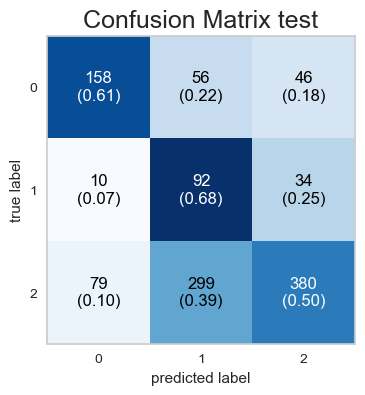

              precision    recall  f1-score   support

       Black       0.64      0.61      0.62       260
    Hispanic       0.21      0.68      0.32       136
       White       0.83      0.50      0.62       758

    accuracy                           0.55      1154
   macro avg       0.56      0.60      0.52      1154
weighted avg       0.71      0.55      0.59      1154


	Train_Set



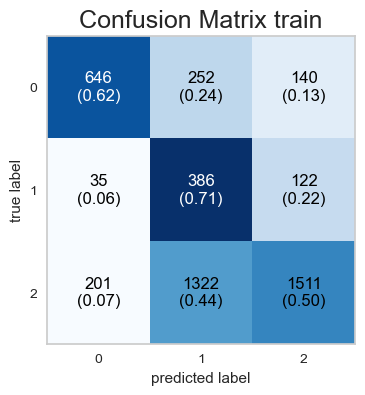

              precision    recall  f1-score   support

       Black       0.73      0.62      0.67      1038
    Hispanic       0.20      0.71      0.31       543
       White       0.85      0.50      0.63      3034

    accuracy                           0.55      4615
   macro avg       0.59      0.61      0.54      4615
weighted avg       0.75      0.55      0.60      4615



In [52]:
Pred_EvalMetric(rf_grid_model, X_train, y_train, X_test, y_test)

## 4. XGBoost

### Vanilla XGBoost Model

In [53]:
xgb_model = XGBClassifier(random_state=101)
step4 = [("OneHotEncoder", column_trans),("model", xgb_model)]

y_train_xgb = y_train.map({"Black": 0, "Hispanic": 1, "White": 2})
y_test_xgb = y_test.map({"Black": 0, "Hispanic": 1, "White": 2})

xgb_pipe = Pipeline(steps=step4)

In [54]:
xgb_pipe.fit(X_train, y_train_xgb)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               cols...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))])

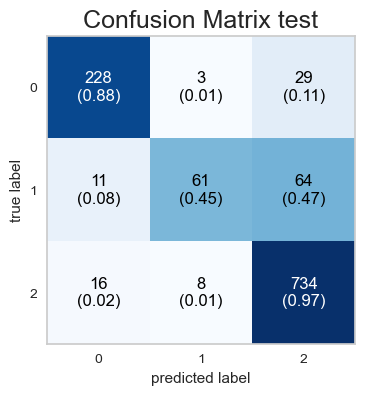

              precision    recall  f1-score   support

           0       0.89      0.88      0.89       260
           1       0.85      0.45      0.59       136
           2       0.89      0.97      0.93       758

    accuracy                           0.89      1154
   macro avg       0.88      0.76      0.80      1154
weighted avg       0.88      0.89      0.88      1154


	Train_Set



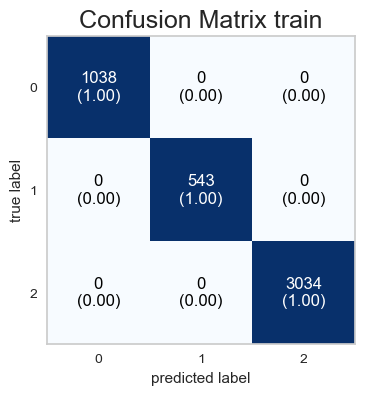

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1038
           1       1.00      1.00      1.00       543
           2       1.00      1.00      1.00      3034

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



In [55]:
Pred_EvalMetric(xgb_pipe, X_train, y_train_xgb, X_test, y_test_xgb)

### XGBoost Model GridsearchCV

In [56]:
n_estimators=  [20,40]
max_depth = [1, 2 ,3]
learning_rate =[0.05, 0.5,1]
subsample =[0.8, 1]
colsample_bytree =[0.8, 1]
param_grid = {
    "model__n_estimators": n_estimators,
    "model__max_depth": max_depth,
    "model__learning_rate": learning_rate,
    "model__subsample": subsample,
    "model__colsample_bytree": colsample_bytree,
}

xgb_grid_model = GridSearchCV(
    xgb_pipe,
    param_grid,
    scoring=make_scorer(recall_score, average=None, labels=[1]), # when use recall_Hispanic both white and black get bad result.
    cv=10,
    n_jobs=-1)

In [57]:
xgb_grid_model.fit(X_train, y_train_xgb)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('OneHotEncoder',
                                        ColumnTransformer(remainder=MinMaxScaler(),
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                                          verbose_feature_names_out=False)),
                                       ('model',
                                        XGBClassifier(base_score=None,
                                                      boo...
                                                      monotone_constraints=None,
                                                      multi_strategy=None,
                                                      n_estimators=None,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      objective='multi:softprob', ...))]),
             n_jobs=-1,
             param_grid={'model__colsample_bytree': [0.8, 1],
                         'model__learning_rate': [0.05, 0.5, 1],
                         'model__max_depth': [1, 2, 3],
                         'model__n_estimators': [20, 40],
                         'model__subsample': [0.8, 1]},
             scoring=make_scorer(recall_score, average=None, labels=[1]))

In [58]:
xgb_grid_model.best_params_

{'model__colsample_bytree': 1,
 'model__learning_rate': 1,
 'model__max_depth': 2,
 'model__n_estimators': 40,
 'model__subsample': 1}

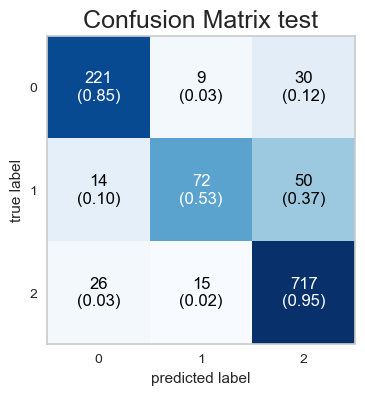

              precision    recall  f1-score   support

           0       0.85      0.85      0.85       260
           1       0.75      0.53      0.62       136
           2       0.90      0.95      0.92       758

    accuracy                           0.88      1154
   macro avg       0.83      0.78      0.80      1154
weighted avg       0.87      0.88      0.87      1154


	Train_Set



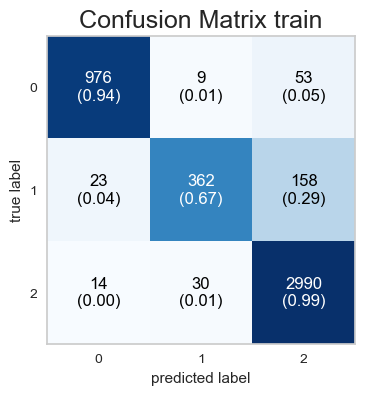

              precision    recall  f1-score   support

           0       0.96      0.94      0.95      1038
           1       0.90      0.67      0.77       543
           2       0.93      0.99      0.96      3034

    accuracy                           0.94      4615
   macro avg       0.93      0.86      0.89      4615
weighted avg       0.94      0.94      0.93      4615



In [59]:
Pred_EvalMetric(xgb_grid_model, X_train, y_train_xgb, X_test, y_test_xgb)

---
---

### Compare all models 

In [60]:
y_pred1 = log_grid_model.predict(X_test)
log_f1 = f1_score(y_test, y_pred1, average=None, labels=["Hispanic"])
log_recall = recall_score(y_test, y_pred1, average=None, labels=["Hispanic"])
log_precision = precision_score(y_test, y_pred1, average=None, labels=["Hispanic"])
log_accuracy = accuracy_score(y_test, y_pred1)


y_pred2 = svc_grid_model.predict(X_test)
svc_f1 = f1_score(y_test, y_pred2, average=None, labels=["Hispanic"])
svc_recall = recall_score(y_test, y_pred2, average=None, labels=["Hispanic"])
svc_precision = precision_score(y_test, y_pred2, average=None, labels=["Hispanic"])
svc_accuracy = accuracy_score(y_test, y_pred2)

y_pred3 = rf_grid_model.predict(X_test)
rf_f1 = f1_score(y_test, y_pred3, average=None, labels=["Hispanic"])
rf_recall = recall_score(y_test, y_pred3, average=None, labels=["Hispanic"])
rf_precision = precision_score(y_test, y_pred3, average=None, labels=["Hispanic"])
rf_accuracy = accuracy_score(y_test, y_pred3)

y_pred4 = xgb_grid_model.predict(X_test)
xgb_f1 = f1_score(y_test_xgb, y_pred4, average=None, labels=[1])
xgb_recall = recall_score(y_test_xgb, y_pred4, average=None, labels=[1])
xgb_precision = precision_score(y_test_xgb, y_pred4, average=None, labels=[1])
xgb_accuracy = accuracy_score(y_test_xgb, y_pred4)



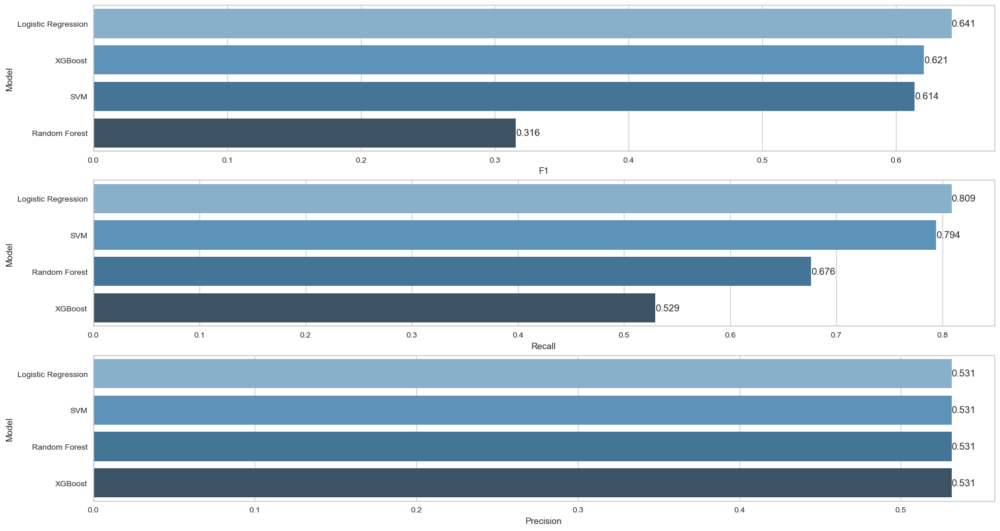

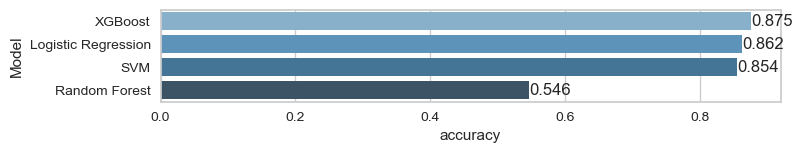

In [61]:
compare = pd.DataFrame(
    {
        "Model": ["Logistic Regression", "SVM", "Random Forest", "XGBoost"],
        "F1": [log_f1[0], svc_f1[0], rf_f1[0], xgb_f1[0]],
        "Recall": [log_recall[0], svc_recall[0], rf_recall[0], xgb_recall[0]],
        "Precision": [log_precision[0], svc_precision[0], rf_precision[0], xgb_precision][0],
        "accuracy": [log_accuracy, svc_accuracy, rf_accuracy, xgb_accuracy]
    }
)


plt.figure(figsize=(20, 15))
plt.subplot(411)
compare = compare.sort_values(by="F1", ascending=False)
ax = sns.barplot(x="F1", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0], fmt="%.3f")

plt.subplot(412)
compare = compare.sort_values(by="Recall", ascending=False)
ax = sns.barplot(x="Recall", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0], fmt="%.3f")

plt.subplot(413)
compare = compare.sort_values(by="Precision", ascending=False)
ax = sns.barplot(x="Precision", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0], fmt="%.3f")
plt.show();

plt.subplot(414)
compare = compare.sort_values(by="accuracy", ascending=False)
ax = sns.barplot(x="accuracy", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0], fmt="%.3f")
plt.show();

---
---

# SMOTE
https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

##  Smote implement

In [62]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

In [63]:
X_train_t = column_trans.fit_transform(X_train)

## Logistic Regression Over/ Under Sampling

In [64]:
over = SMOTE()
X_train_over, y_train_over = over.fit_resample(X_train_t, y_train)

In [65]:
y_train_over.value_counts()

Hispanic    3034
White       3034
Black       3034
Name: DODRace, dtype: int64

In [66]:
under = RandomUnderSampler()
X_train_under, y_train_under = under.fit_resample(X_train_t, y_train)

In [67]:
y_train_under.value_counts()

Black       543
Hispanic    543
White       543
Name: DODRace, dtype: int64

##  Over Sampling

In [68]:
step5 = [
    ("OneHotEncoder", column_trans),
    ("over", over),
    ("model", log_model),
] 
over_pipe = Pipeline(steps=step5)


In [69]:
over_pipe.fit(X_train, y_train)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('over', SMOTE()),
                ('model',
                 LogisticRegression(class_weight='balanced', max_iter=1000,
                                    random_state=101))])

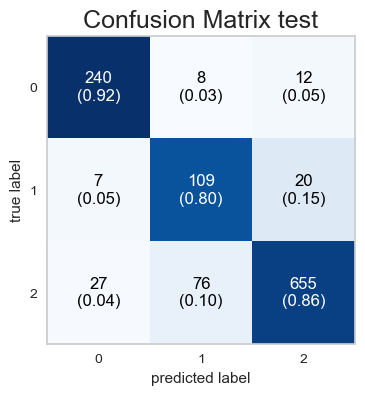

              precision    recall  f1-score   support

       Black       0.88      0.92      0.90       260
    Hispanic       0.56      0.80      0.66       136
       White       0.95      0.86      0.91       758

    accuracy                           0.87      1154
   macro avg       0.80      0.86      0.82      1154
weighted avg       0.89      0.87      0.88      1154


	Train_Set



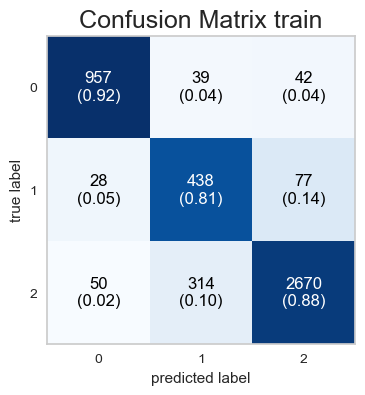

              precision    recall  f1-score   support

       Black       0.92      0.92      0.92      1038
    Hispanic       0.55      0.81      0.66       543
       White       0.96      0.88      0.92      3034

    accuracy                           0.88      4615
   macro avg       0.81      0.87      0.83      4615
weighted avg       0.90      0.88      0.89      4615



In [70]:
Pred_EvalMetric(over_pipe, X_train, y_train, X_test, y_test)

##  Under Sampling

In [71]:
step6 = [
    ("OneHotEncoder", column_trans),
    ("under", under),
    ("model", log_model)
]

under_pipe = Pipeline(steps=step5)


In [72]:
under_pipe.fit(X_train, y_train)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('over', SMOTE()),
                ('model',
                 LogisticRegression(class_weight='balanced', max_iter=1000,
                                    random_state=101))])

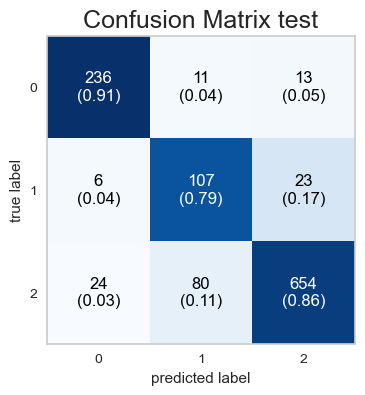

              precision    recall  f1-score   support

       Black       0.89      0.91      0.90       260
    Hispanic       0.54      0.79      0.64       136
       White       0.95      0.86      0.90       758

    accuracy                           0.86      1154
   macro avg       0.79      0.85      0.81      1154
weighted avg       0.89      0.86      0.87      1154


	Train_Set



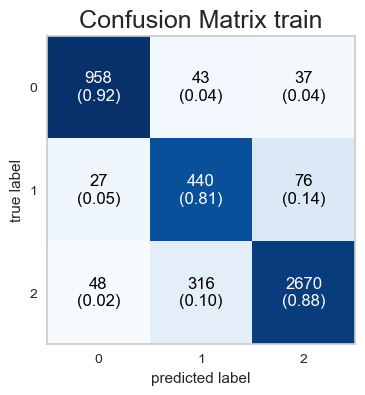

              precision    recall  f1-score   support

       Black       0.93      0.92      0.93      1038
    Hispanic       0.55      0.81      0.66       543
       White       0.96      0.88      0.92      3034

    accuracy                           0.88      4615
   macro avg       0.81      0.87      0.83      4615
weighted avg       0.90      0.88      0.89      4615



In [73]:
Pred_EvalMetric(under_pipe, X_train, y_train, X_test, y_test)

## Both Over & Under Sampling

In [74]:
step7 = [
    ("OneHotEncoder", column_trans),
    ("under", under),
    ("over", over),
    ("model", log_model)
]

over_under_pipe = Pipeline(steps=step7)


In [75]:
over_under_pipe.fit(X_train, y_train)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('under', RandomUnderSampler()), ('over', SMOTE()),
                ('model',
                 LogisticRegression(class_weight='balanced', max_iter=1000,
                                    random_state=101))])

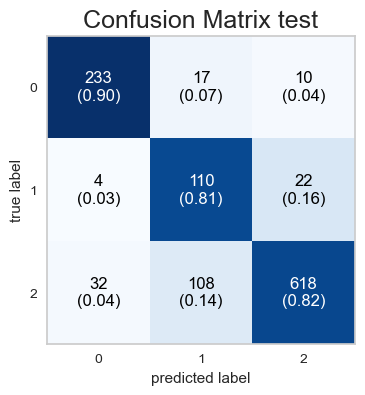

              precision    recall  f1-score   support

       Black       0.87      0.90      0.88       260
    Hispanic       0.47      0.81      0.59       136
       White       0.95      0.82      0.88       758

    accuracy                           0.83      1154
   macro avg       0.76      0.84      0.78      1154
weighted avg       0.87      0.83      0.84      1154


	Train_Set



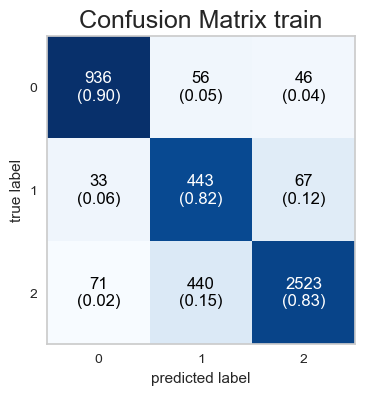

              precision    recall  f1-score   support

       Black       0.90      0.90      0.90      1038
    Hispanic       0.47      0.82      0.60       543
       White       0.96      0.83      0.89      3034

    accuracy                           0.85      4615
   macro avg       0.78      0.85      0.80      4615
weighted avg       0.89      0.85      0.86      4615



In [76]:
Pred_EvalMetric(over_under_pipe, X_train, y_train, X_test, y_test)

### Compare Logistic Regression model with /without sampling

In [77]:
y_pred5 = over_pipe.predict(X_test)
log1_f1 = f1_score(y_test, y_pred5, average=None, labels=["Hispanic"])
log1_recall = recall_score(y_test, y_pred5, average=None, labels=["Hispanic"])
log1_precision = precision_score(y_test, y_pred5, average=None, labels=["Hispanic"])
log1_accuracy = accuracy_score(y_test, y_pred5)

y_pred6 = under_pipe.predict(X_test)
log2_f1 = f1_score(y_test, y_pred6, average=None, labels=["Hispanic"])
log2_recall = recall_score(y_test, y_pred6, average=None, labels=["Hispanic"])
log2_precision = precision_score(y_test, y_pred6, average=None, labels=["Hispanic"])
log2_accuracy = accuracy_score(y_test, y_pred6)

y_pred7 = over_under_pipe.predict(X_test)
log3_f1 = f1_score(y_test, y_pred7, average=None, labels=["Hispanic"])
log3_recall = recall_score(y_test, y_pred7, average=None, labels=["Hispanic"])
log3_precision = precision_score(y_test, y_pred7, average=None, labels=["Hispanic"])
log3_accuracy = accuracy_score(y_test, y_pred7)

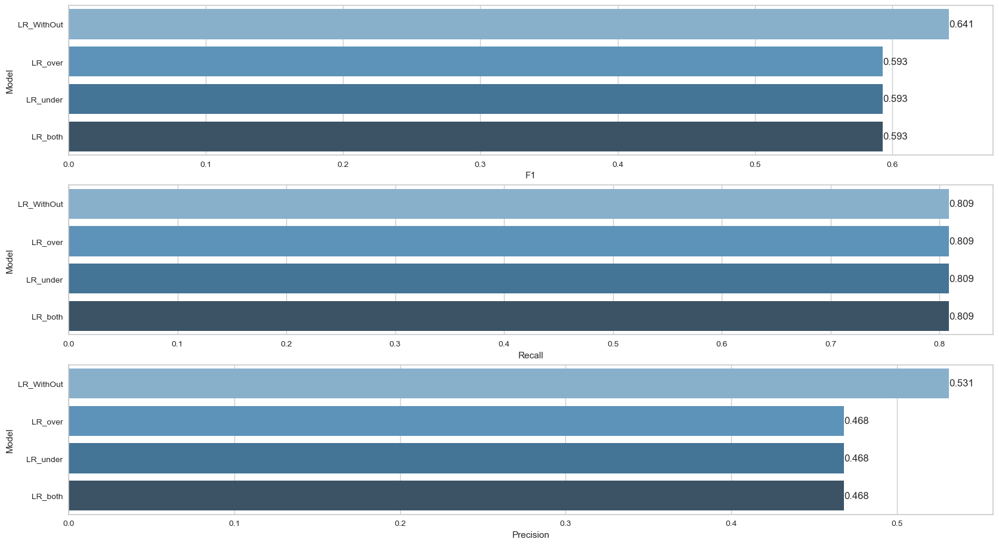

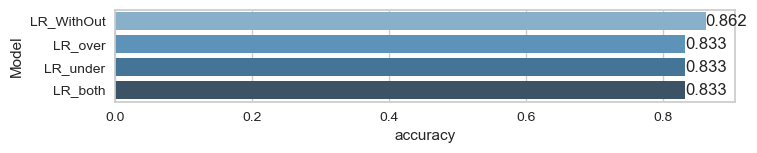

In [78]:
compare = pd.DataFrame(
    {
        "Model": ["LR_WithOut", "LR_over", "LR_under", "LR_both"],
        "F1": [log_f1[0], log1_f1[0], log2_f1[0], log3_f1[0]],
        "Recall": [log_recall[0], log1_recall[0], log2_recall[0], log3_recall[0]],
        "Precision": [log_precision[0], log1_precision[0], log2_precision[0], log3_precision[0]],
        "accuracy": [log_accuracy, log1_accuracy, log2_accuracy, log3_accuracy]
    }
)


plt.figure(figsize=(20, 15))
plt.subplot(411)
compare = compare.sort_values(by="F1", ascending=False)
ax = sns.barplot(x="F1", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0], fmt="%.3f")

plt.subplot(412)
compare = compare.sort_values(by="Recall", ascending=False)
ax = sns.barplot(x="Recall", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0], fmt="%.3f")

plt.subplot(413)
compare = compare.sort_values(by="Precision", ascending=False)
ax = sns.barplot(x="Precision", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0], fmt="%.3f")
plt.show();

plt.subplot(414)
compare = compare.sort_values(by="accuracy", ascending=False)
ax = sns.barplot(x="accuracy", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0], fmt="%.3f")
plt.show();

## Other Evaluation Metrics for Multiclass Classification

- Evaluation metrics
https://towardsdatascience.com/comprehensive-guide-on-multiclass-classification-metrics-af94cfb83fbd

In [79]:
from sklearn.metrics import matthews_corrcoef
y_pred_log = log_grid_model.predict(X_test)
y_pred_svc = svc_grid_model.predict(X_test)
y_pred_rf = rf_grid_model.predict(X_test)
y_pred_xgb = xgb_grid_model.predict(X_test)
print(matthews_corrcoef(y_test, y_pred_log))
print(matthews_corrcoef(y_test, y_pred_svc))
print(matthews_corrcoef(y_test, y_pred_rf))
print(matthews_corrcoef(y_test_xgb, y_pred_xgb))

0.7518421405891825
0.7383715519887103
0.33360450907770306
0.7454306565138523


In [80]:
from sklearn.metrics import cohen_kappa_score
print(cohen_kappa_score(y_test, y_pred_log))
print(cohen_kappa_score(y_test, y_pred_svc))
print(cohen_kappa_score(y_test, y_pred_rf))
print(cohen_kappa_score(y_test_xgb, y_pred_xgb))

0.7446987911574168
0.7306659998332916
0.29524582062972604
0.7430297182196903


# SHAP

In [81]:
#Best parameters of Logistic Regression
model_shap = LogisticRegression(
    class_weight="balanced",
    max_iter=10000,
    random_state=101,
    penalty="l2",
    solver="lbfgs",
    C = 2
)

model_shap.fit(X_train_trans, y_train)
features = column_trans.get_feature_names_out()



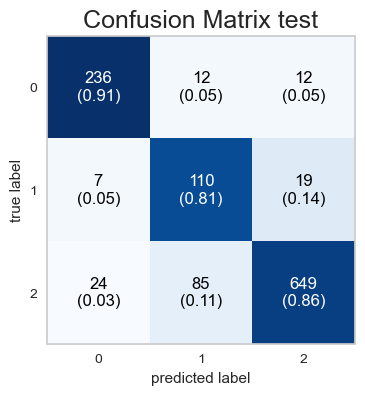

              precision    recall  f1-score   support

       Black       0.88      0.91      0.90       260
    Hispanic       0.53      0.81      0.64       136
       White       0.95      0.86      0.90       758

    accuracy                           0.86      1154
   macro avg       0.79      0.86      0.81      1154
weighted avg       0.89      0.86      0.87      1154


	Train_Set



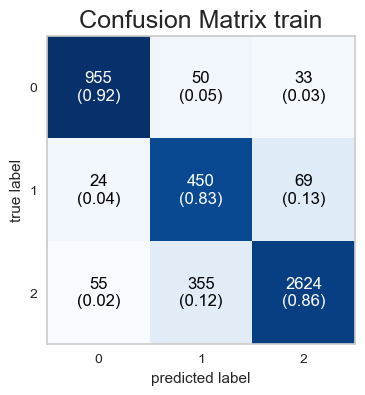

              precision    recall  f1-score   support

       Black       0.92      0.92      0.92      1038
    Hispanic       0.53      0.83      0.64       543
       White       0.96      0.86      0.91      3034

    accuracy                           0.87      4615
   macro avg       0.80      0.87      0.83      4615
weighted avg       0.90      0.87      0.88      4615



In [82]:
Pred_EvalMetric(model_shap, X_train_trans, y_train, X_test_trans, y_test)

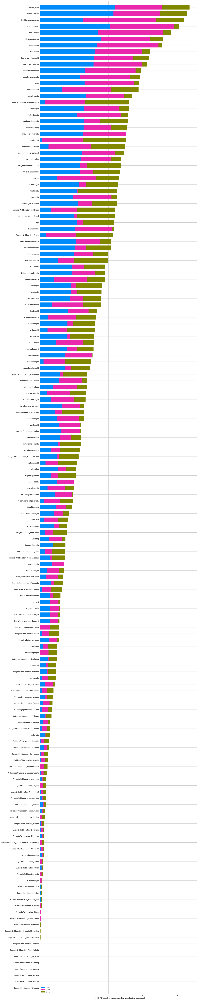

In [83]:
explainer = shap.LinearExplainer(model_shap, X_train_trans) 
shap_values = explainer.shap_values(X_test_trans)

shap.summary_plot(
    shap_values, max_display=300, feature_names=features, plot_size=(20, 100))


# Before the Deployment
- Choose the model that works best based on your chosen metric
- For final step, fit the best model with whole dataset to get better performance.
- And your model ready to deploy, dump your model and scaler.

# Best model is a  Logistic Regression model

In [84]:
model_log = LogisticRegression(
    class_weight="balanced",
    max_iter=10000,
    random_state=101,
    penalty="l2",
    solver="lbfgs",
    C = 2
)

step8 = [
    ("OneHotEncoder", column_trans),
    ("model", model_log),
] 
model_log_pipe = Pipeline(steps=step8)

model_log_pipe.fit(X, y)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('model',
                 LogisticRegression(C=2, class_weight='balanced',
                                    max_iter=10000, random_state=101))])

	Train_Set



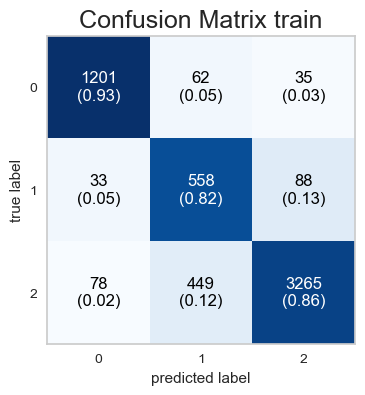

              precision    recall  f1-score   support

       Black       0.92      0.93      0.92      1298
    Hispanic       0.52      0.82      0.64       679
       White       0.96      0.86      0.91      3792

    accuracy                           0.87      5769
   macro avg       0.80      0.87      0.82      5769
weighted avg       0.90      0.87      0.88      5769



In [85]:

    y_pred = model_log_pipe.predict(X)

    print("\tTrain_Set\n")
    fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y, y_pred), show_normed = True, figsize=(4,4))
    plt.title('Confusion Matrix train', fontsize=18)
    plt.show()
    print(classification_report(y, y_pred))

# EXTRA KNN!

In [86]:
knn_model = KNeighborsClassifier(n_neighbors=5)
step9 = [("OneHotEncoder", column_trans),("model", knn_model)]
knn_pipe = Pipeline(steps=step9)


n_neighbors=  [1,3,5]
weights = ['uniform', 'distance']
algorithm =['auto', 'ball_tree', 'kd_tree', 'brute']

param_grid = {
    "model__n_neighbors": n_neighbors,
    "model__weights": weights,
    "model__algorithm": algorithm
}

knn_grid_model = GridSearchCV(
    knn_pipe,
    param_grid,
    scoring = recall_Hispanic,
    cv=10,
    n_jobs=-1)

In [87]:
knn_grid_model.fit(X_train, y_train)


GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('OneHotEncoder',
                                        ColumnTransformer(remainder=MinMaxScaler(),
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                                          verbose_feature_names_out=False)),
                                       ('model', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'model__algorithm': ['auto', 'ball_tree', 'kd_tree',
                                              'brute'],
                         'model__n_neighbors': [1, 3, 5],
                         'model__weights': ['uniform', 'distance']},
             scoring=make_scorer(recall_score, average=None, labels=['Hispanic']))

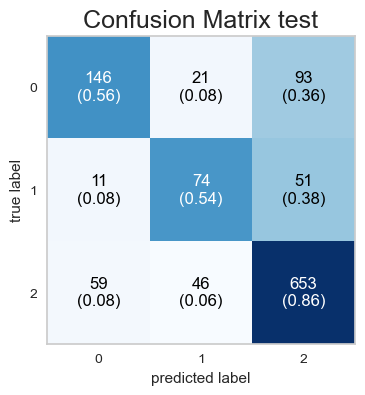

              precision    recall  f1-score   support

       Black       0.68      0.56      0.61       260
    Hispanic       0.52      0.54      0.53       136
       White       0.82      0.86      0.84       758

    accuracy                           0.76      1154
   macro avg       0.67      0.66      0.66      1154
weighted avg       0.75      0.76      0.75      1154


	Train_Set



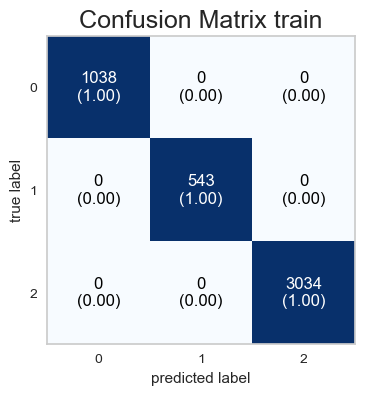

              precision    recall  f1-score   support

       Black       1.00      1.00      1.00      1038
    Hispanic       1.00      1.00      1.00       543
       White       1.00      1.00      1.00      3034

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



In [88]:
Pred_EvalMetric(knn_grid_model, X_train, y_train, X_test, y_test)

# EXTRA PCA!

In [89]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [90]:
Xcopy = X.copy()
ycopy = y.copy()


In [91]:
Xcopy1 =Xcopy[[ 'abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bimalleolarbreadth', 'bitragionchinarc', 'bitragionsubmandibulararc',
       'bizygomaticbreadth', 'buttockcircumference', 'buttockdepth',
       'buttockheight', 'buttockkneelength', 'buttockpopliteallength',
       'calfcircumference', 'cervicaleheight', 'chestbreadth',
       'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight',
       'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth',
       'earlength', 'earprotrusion', 'elbowrestheight', 'eyeheightsitting',
       'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength',
       'forearmcircumferenceflexed', 'forearmforearmbreadth',
       'forearmhandlength', 'functionalleglength', 'handbreadth',
       'handcircumference', 'handlength', 'headbreadth', 'headcircumference',
       'headlength', 'heelanklecircumference', 'heelbreadth', 'hipbreadth',
       'hipbreadthsitting', 'iliocristaleheight', 'interpupillarybreadth',
       'interscyei', 'interscyeii', 'kneeheightmidpatella',
       'kneeheightsitting', 'lateralfemoralepicondyleheight',
       'lateralmalleolusheight', 'lowerthighcircumference',
       'mentonsellionlength', 'neckcircumference', 'neckcircumferencebase',
       'overheadfingertipreachsitting', 'palmlength', 'poplitealheight',
       'radialestylionlength', 'shouldercircumference', 'shoulderelbowlength',
       'shoulderlength', 'sittingheight', 'sleevelengthspinewrist',
       'sleeveoutseam', 'span', 'suprasternaleheight',
       'tenthribheight', 'thighcircumference', 'thighclearance',
       'thumbtipreach', 'tibialheight', 'tragiontopofhead',
       'trochanterionheight', 'verticaltrunkcircumferenceusa',
       'waistbacklength', 'waistbreadth', 'waistcircumference', 'waistdepth',
       'waistfrontlengthsitting', 'waistheightomphalion']]


In [92]:

pca = PCA(n_components=8)
Xcopy1_t = StandardScaler().fit_transform(Xcopy1)
principalComponents = pca.fit_transform(Xcopy1_t)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['p1', 'p2' ,'p3','p4','p5','p6','p7','p8'])

principalDf.reset_index(drop=True, inplace=True)

In [93]:
Xcopy2 =pd.DataFrame(Xcopy[['weightkg','wristcircumference', 'wristheight', 'Gender', 'SubjectsBirthLocation','Age', 'WritingPreference','stature']])
Xcopy2.reset_index(drop=True, inplace=True)

In [94]:
finalDf = pd.concat([principalDf, Xcopy2], axis = 1)
finalDf.shape

(5769, 16)

In [95]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.20  ,random_state=101, stratify=y)

In [96]:
model_log_pca = LogisticRegression(
    class_weight="balanced",
    max_iter=10000,
    random_state=101,
    penalty="l2",
    solver="lbfgs",
    C = 2
)

step12 = [
    ("OneHotEncoder", column_trans),
    ("model", model_log_pca),
    
] 
model_log_pipe_pca = Pipeline(steps=step12)


In [97]:
model_log_pipe_pca.fit(X, y)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  Index(['Gender', 'SubjectsBirthLocation', 'WritingPreference'], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('model',
                 LogisticRegression(C=2, class_weight='balanced',
                                    max_iter=10000, random_state=101))])

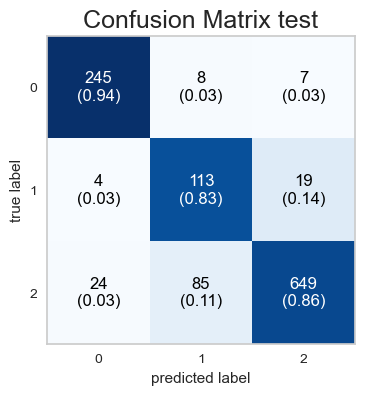

              precision    recall  f1-score   support

       Black       0.90      0.94      0.92       260
    Hispanic       0.55      0.83      0.66       136
       White       0.96      0.86      0.91       758

    accuracy                           0.87      1154
   macro avg       0.80      0.88      0.83      1154
weighted avg       0.90      0.87      0.88      1154


	Train_Set



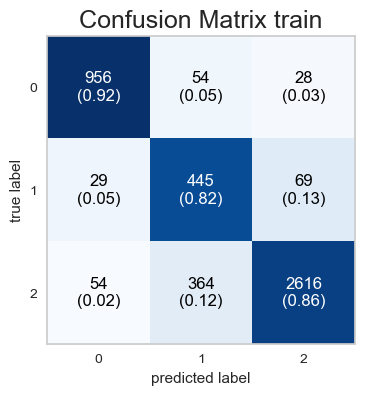

              precision    recall  f1-score   support

       Black       0.92      0.92      0.92      1038
    Hispanic       0.52      0.82      0.63       543
       White       0.96      0.86      0.91      3034

    accuracy                           0.87      4615
   macro avg       0.80      0.87      0.82      4615
weighted avg       0.90      0.87      0.88      4615



In [98]:
Pred_EvalMetric(model_log_pipe_pca, X_train, y_train, X_test, y_test)

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___